## CarND - Advanced Lane Finding Project
### author: dshin


The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [1]:
"""

load required packages

"""
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
% matplotlib inline


## camera calibration

In [2]:
"""

camera calibration -- learn calibration parameters

"""

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

ims_gray = []
v_name = []

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners

is_display = 0
for fname in images:
    if 'undist' in fname:
        continue
    print(fname)

    v_name.append(fname)
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ims_gray.append(gray)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        if is_display:
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            cv2.imshow('img',img)
            cv2.waitKey(500)
            
if is_display:
    cv2.destroyAllWindows()

im_shape_for_cv = gray.shape[::-1]    
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, im_shape_for_cv, None, None)
   
print('fin calib!')


camera_cal/calibration1.jpg
camera_cal/calibration10.jpg
camera_cal/calibration11.jpg
camera_cal/calibration12.jpg
camera_cal/calibration13.jpg
camera_cal/calibration14.jpg
camera_cal/calibration15.jpg
camera_cal/calibration16.jpg
camera_cal/calibration17.jpg
camera_cal/calibration18.jpg
camera_cal/calibration19.jpg
camera_cal/calibration2.jpg
camera_cal/calibration20.jpg
camera_cal/calibration3.jpg
camera_cal/calibration4.jpg
camera_cal/calibration5.jpg
camera_cal/calibration6.jpg
camera_cal/calibration7.jpg
camera_cal/calibration8.jpg
camera_cal/calibration9.jpg
fin calib!


In [3]:
im_shape_for_cv

(1280, 720)

In [4]:
"""

sample
camera calibration -- perform undistortion on calibration images (validation)

"""

is_display = 0
for k in range(len(ims_gray)):
    undist = cv2.undistort(ims_gray[k], mtx, dist, None, mtx)
    names = v_name[k][:-4]+'_undist.jpg'
    cv2.imwrite(names,undist)
    


## test images

In [18]:
"""

pre-algo : get perspective warp

"""


src_upper_column = 590
src_lower_column = 200

src = [ [src_lower_column,700], [im_shape_for_cv[0]-src_lower_column,700], [src_upper_column,450], [im_shape_for_cv[0]-src_upper_column,450] ]
dst = [ [300,720], [980,720], [300,0], [980,0] ]

M_perspective = cv2.getPerspectiveTransform(np.float32(src), np.float32(dst))
M_perspective_inv = np.linalg.inv(M_perspective)

print src
print dst

[[200, 700], [1080, 700], [590, 450], [690, 450]]
[[300, 720], [980, 720], [300, 0], [980, 0]]


In [6]:
"""

get supp functions

"""

buffer_leftx = [[0.]]
buffer_lefty = [[0.]]
buffer_rightx = [[0.]]
buffer_righty = [[0.]]

filter_counter_switch = [0]
filter_buffer_left_fit = []
filter_buffer_right_fit = []

def fit_road_curves(binary_warped):
    # borrowed from carnd lecture
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 60
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 


    thres_bump_left = 200
    
    if np.mean(leftx) < thres_bump_left:
        leftx = buffer_leftx[0]
        lefty = buffer_lefty[0]
    else:
        buffer_leftx.pop(0)
        buffer_leftx.append(leftx)
        buffer_lefty.pop(0)
        buffer_lefty.append(lefty)
        
    thres_bump_right = 100
    if np.mean(rightx) > (im_shape_for_cv[0]-thres_bump_right):
        rightx = buffer_rightx[0]
        righty = buffer_righty[0]
    else:
        buffer_rightx.pop(0)
        buffer_rightx.append(rightx)
        buffer_righty.pop(0)
        buffer_righty.append(righty)


    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    debug_mode = debug_mode_switch[0]
    
    if debug_mode == 0:
        filter_length = 5
        filter_counter_switch[0] += 1
        if filter_counter_switch[0] > filter_length:
            filter_buffer_left_fit.pop(0)
            filter_buffer_right_fit.pop(0)
        filter_buffer_left_fit.append(left_fit)
        filter_buffer_right_fit.append(right_fit)

        left_fit = np.mean(filter_buffer_left_fit,0)
        right_fit = np.mean(filter_buffer_right_fit,0)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # compute curvature
        
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    left_shift = (left_fit_cr[-1]+right_fit_cr[-1])/2. - 3.382
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*max(lefty)*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*max(righty)*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    curverad = (left_curverad+right_curverad)/2.

    results_fit ={\
                  'left_lane_inds': left_lane_inds, 'right_lane_inds': right_lane_inds, 
                  'left_fit': left_fit, 'right_fit': right_fit,
                  'nonzeroy': nonzeroy, 'nonzerox': nonzerox,
                  'ploty': ploty, 'left_fitx': left_fitx, 'right_fitx': right_fitx,
                  'left_curverad': left_curverad, 'right_curverad': right_curverad, 'curverad': curverad,
                  'left_shift': left_shift
                 }
    return results_fit
    
def plot_road_curves(binary_warped, results_fit):
    
    left_fit = results_fit['left_fit']
    right_fit = results_fit['right_fit']
    left_lane_inds = results_fit['left_lane_inds']
    right_lane_inds = results_fit['right_lane_inds']
    nonzeroy = results_fit['nonzeroy']
    nonzerox = results_fit['nonzerox']
    ploty = results_fit['ploty']
    left_fitx = results_fit['left_fitx']
    right_fitx = results_fit['right_fitx']
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    plt.figure
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()
    
print('fin')

fin


In [19]:

"""

define core process_image function

"""

debug_mode_switch = [0]

    
def process_image(img):

    """
    debug_mode = 1   to generate test images
    debug_mode = 0   to single-shot run on video
    
    """
    debug_mode = debug_mode_switch[0]
    
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    rgb_undist = cv2.undistort(rgb, mtx, dist, None, mtx)
    hls_undist = cv2.undistort(hls, mtx, dist, None, mtx)
    gray_undist = cv2.undistort(gray, mtx, dist, None, mtx)


    # apply threshold operators on undist images!
    
    # Sobel x
    sobelx = cv2.Sobel(gray_undist, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    s_channel = hls_undist[:,:,2]
    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    warped = cv2.warpPerspective(combined_binary, M_perspective, im_shape_for_cv, flags=cv2.INTER_LINEAR)
    
    results_fit = fit_road_curves(warped) # dictionary of road curve statistics

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([results_fit['left_fitx'], results_fit['ploty']]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([results_fit['right_fitx'], results_fit['ploty']])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_perspective_inv, im_shape_for_cv) 
    
    # Combine the result with the original image
    
    if debug_mode:
        iii = rgb
    else:
        iii = img
    
    img_fin = cv2.addWeighted(iii, 1, newwarp, 0.3, 0)
    
    
    val1 = int(results_fit['curverad'])
    val2 = int(results_fit['left_shift']*1000)/1000.
    
    cv2.putText(img_fin,"Rad. of Curv. = "+str(val1)+ ' meters',
                (100,60), cv2.FONT_HERSHEY_SIMPLEX, fontScale=2, color=0, thickness=5)
    cv2.putText(img_fin,'Left shift amount = '+str(val2)+' meters',
                (100,120), cv2.FONT_HERSHEY_SIMPLEX, fontScale=2, color=0, thickness=5)

    
    if debug_mode:
        rgb_undist_warped = cv2.warpPerspective(rgb_undist, M_perspective, im_shape_for_cv, flags=cv2.INTER_LINEAR)

        results = {\
                   'rgb': rgb,
                   'rgb_undist': rgb_undist,
                   'rgb_undist_warped': rgb_undist_warped,
                   'hls': hls,
                   'hls_undist': hls_undist,
                   'gray': gray,
                   'gray_undist': gray_undist,
                   'binary': combined_binary,
                   'binary_warped': warped,
                   'results_fit': results_fit,
                   'img_fin': img_fin
                  }
        return results
    else:
        return img_fin

print('fin')


fin


In [20]:

def plot_debug(results):
   
    plt.figure(figsize=(16,5))
    plt.subplot(1,3,1)
    plt.imshow(results['rgb'])
    plt.title('rgb raw')
    plt.subplot(1,3,2)
    plt.imshow(results['hls'])
    plt.title('hls raw')
    plt.subplot(1,3,3)
    plt.imshow(results['gray'], cmap='gray')
    plt.title('gray raw')
    plt.show()
        
    plt.figure(figsize=(16,5))
    plt.subplot(1,3,1)
    plt.imshow(results['rgb_undist'][:,:,0], cmap='gray')
    plt.title('undist r')
    plt.subplot(1,3,2)
    plt.imshow(results['rgb_undist'][:,:,1], cmap='gray')
    plt.title('undist g')
    plt.subplot(1,3,3)
    plt.imshow(results['rgb_undist'][:,:,2], cmap='gray')
    plt.title('undist b')
    plt.show()
    
    plt.figure(figsize=(16,5))
    plt.subplot(1,3,1)
    plt.imshow(results['hls_undist'][:,:,0], cmap='gray')
    plt.title('undist h')
    plt.subplot(1,3,2)
    plt.imshow(results['hls_undist'][:,:,1], cmap='gray')
    plt.title('undist l')
    plt.subplot(1,3,3)
    plt.imshow(results['hls_undist'][:,:,2], cmap='gray')
    plt.title('undist s')
    plt.show()

    plt.figure(figsize=(16,5))
    plt.subplot(1,3,1)
    plt.imshow(results['binary'], cmap='gray')
    plt.title('thres')
    plt.subplot(1,3,2)
    plt.imshow(results['binary_warped'], cmap='gray')
    plt.title('thres')
    plt.show()
    
    plot_road_curves(results['binary_warped'], results['results_fit'])

    plt.figure(figsize=(16,5))
    plt.imshow(results['img_fin'])
    plt.title('fin')
    plt.show()
    

In [21]:
"""

process test images

"""

files = glob.glob('test_images/*jpg')

results_store = {}


debug_mode_switch = [1]

lists = ['straight_lines1.jpg',
         'straight_lines2.jpg',
         'test1.jpg',
         'test2.jpg',
         'test3.jpg',
         'test4.jpg',
         'test5.jpg',
         'test6.jpg']

c = 0
for f in files:
    if(not f in ['test_images/'+listval for listval in lists]):
        continue
    print(f)
    
    img = cv2.imread(f)
    results = process_image(img)
    results_store[f] = results
    
    heads = f.split('/')[1].split('.')[0]
    
    if c == 0:
        cv2.imwrite('test_images/'+heads+'_rgb_undist.jpg',cv2.cvtColor(results['rgb_undist'],cv2.COLOR_RGB2BGR))
        cv2.imwrite('test_images/'+heads+'_rgb_undist_warped.jpg',cv2.cvtColor(results['rgb_undist_warped'],cv2.COLOR_RGB2BGR))
        cv2.imwrite('test_images/'+heads+'_binary.jpg',results['binary']*255.)
        cv2.imwrite('test_images/'+heads+'_fin.jpg',cv2.cvtColor(results['img_fin'],cv2.COLOR_RGB2BGR))
        c = 1
#        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)


test_images/straight_lines1.jpg
test_images/straight_lines2.jpg
test_images/test1.jpg
test_images/test2.jpg
test_images/test3.jpg
test_images/test4.jpg
test_images/test5.jpg
test_images/test6.jpg


In [ ]:
"""

some more testing

"""

results = results_store['test_images/straight_lines1.jpg']

plt.figure(figsize=(13,5))
plt.subplot(1,2,1)
plt.plot([src[0][0],src[1][0]],[src[0][1],src[1][1]],'r-',linewidth=2)
plt.plot([src[0][0],src[2][0]],[src[0][1],src[2][1]],'r-',linewidth=2)
plt.plot([src[3][0],src[2][0]],[src[3][1],src[2][1]],'r-',linewidth=2)
plt.plot([src[3][0],src[1][0]],[src[3][1],src[1][1]],'r-',linewidth=2)
plt.imshow(results['rgb_undist'])
plt.xticks([]); plt.yticks([])
plt.title('raw')
plt.subplot(1,2,2)
plt.plot([dst[0][0],dst[1][0]],[dst[0][1],dst[1][1]],'r-',linewidth=2)
plt.plot([dst[0][0],dst[2][0]],[dst[0][1],dst[2][1]],'r-',linewidth=2)
plt.plot([dst[3][0],dst[2][0]],[dst[3][1],dst[2][1]],'r-',linewidth=2)
plt.plot([dst[3][0],dst[1][0]],[dst[3][1],dst[1][1]],'r-',linewidth=2)
plt.imshow(results['rgb_undist_warped'])
plt.xticks([]); plt.yticks([])
plt.title('warped')
plt.show()


. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
test_images/straight_lines1.jpg


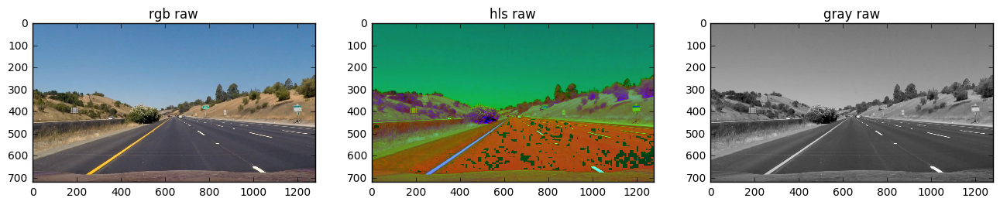

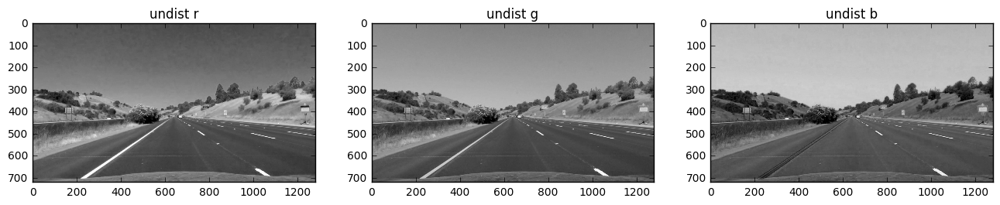

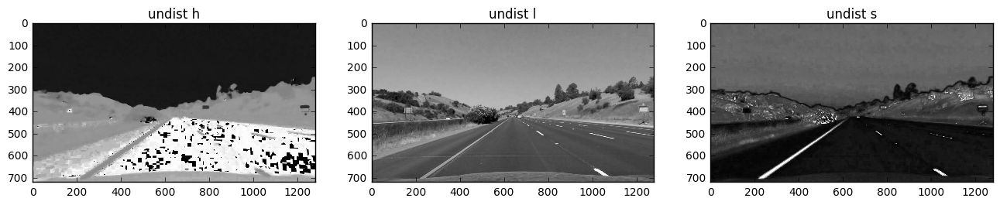

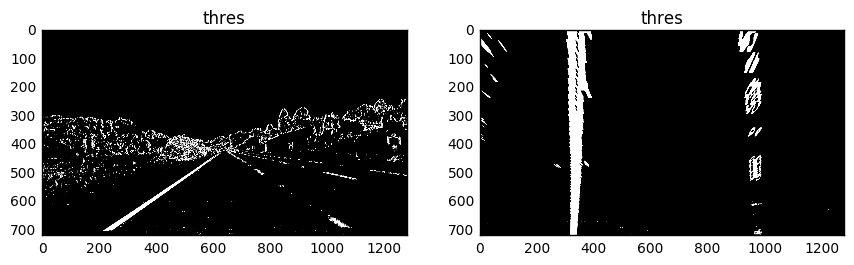

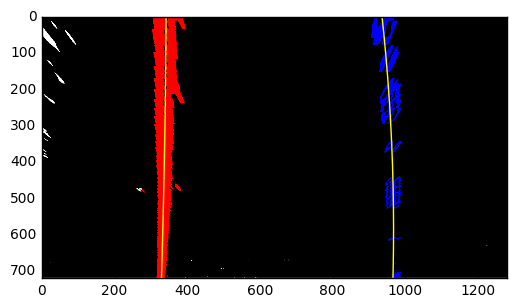

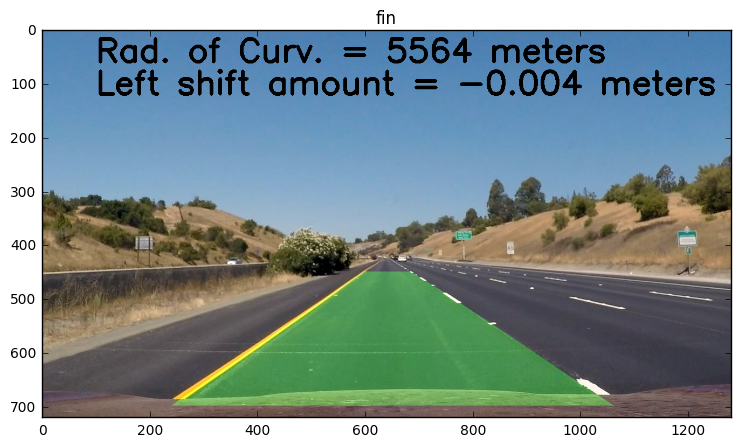

. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
test_images/straight_lines2.jpg


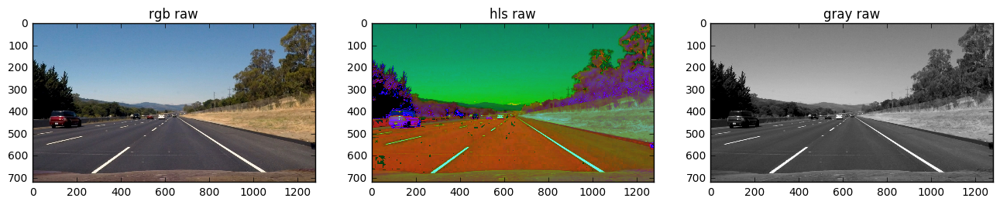

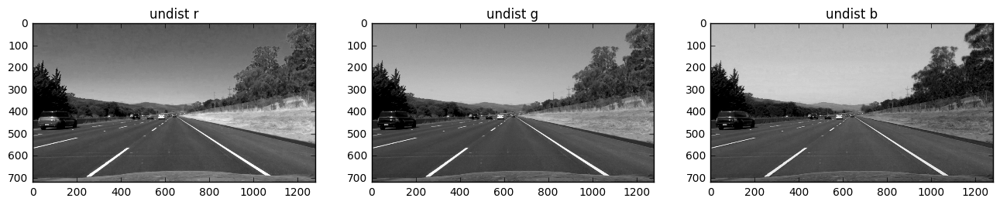

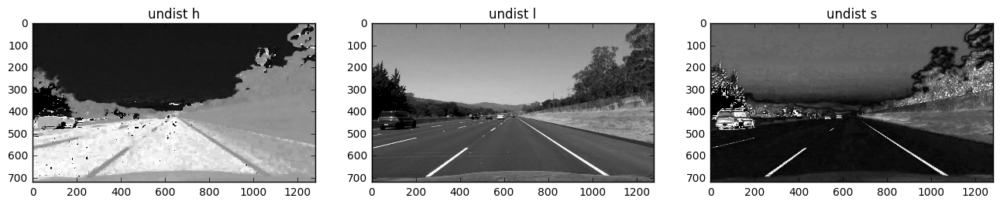

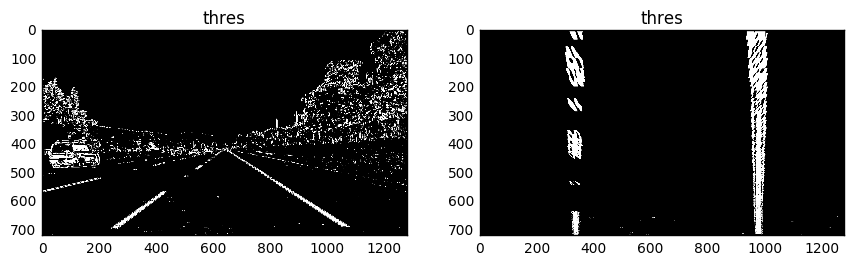

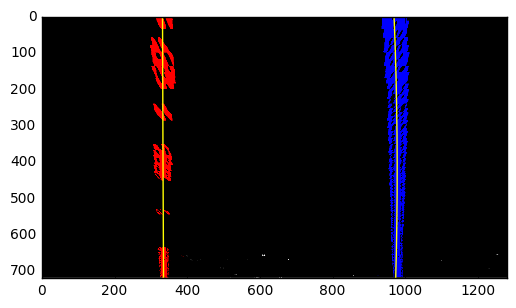

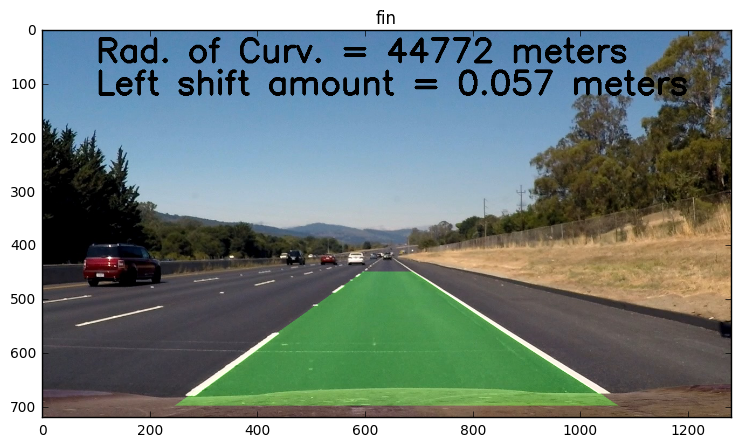

. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
test_images/test1.jpg


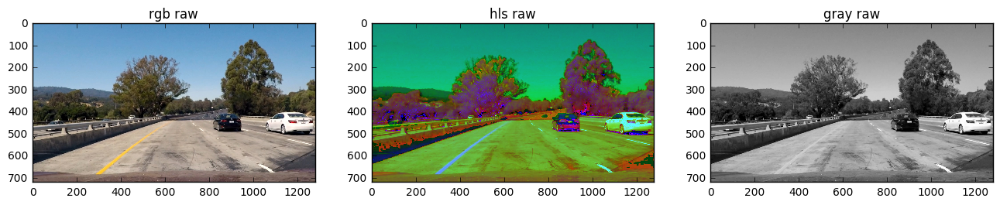

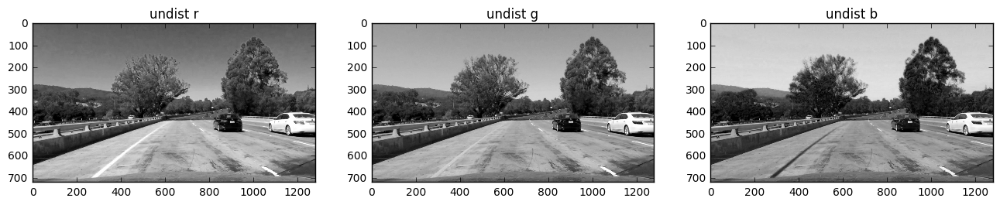

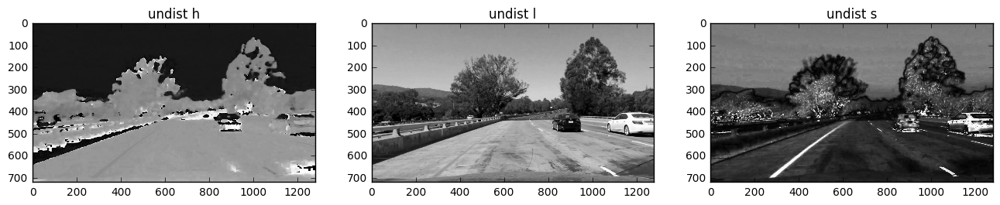

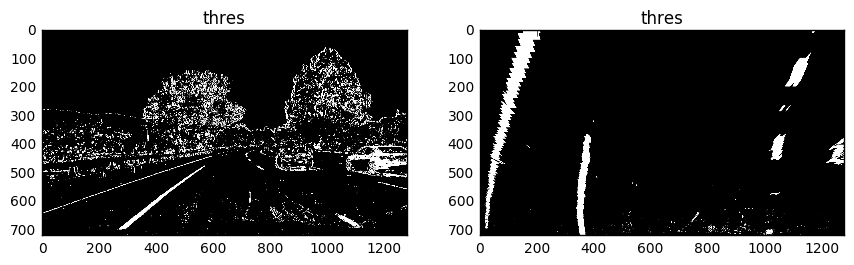

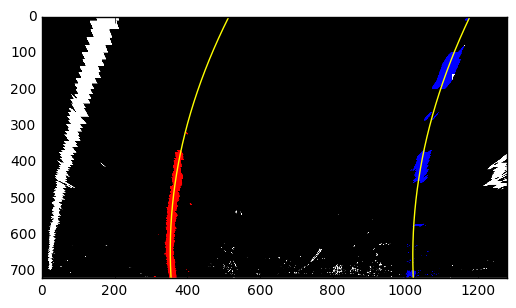

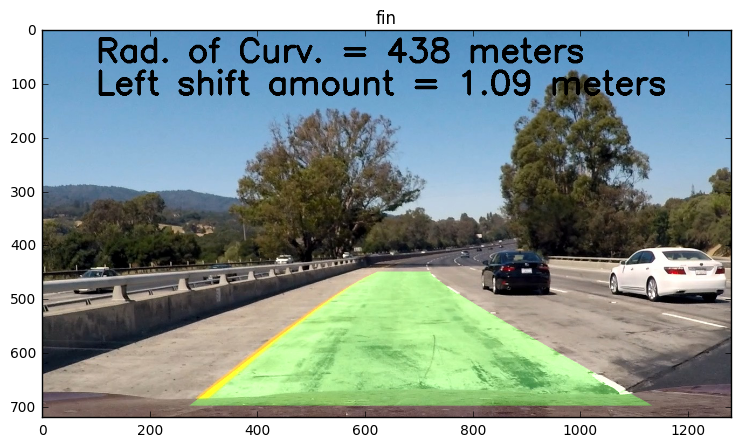

. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
test_images/test2.jpg


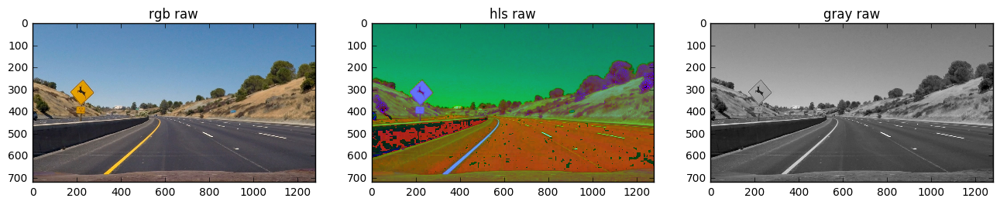

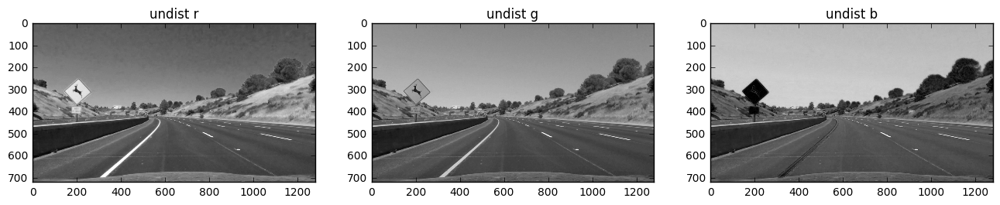

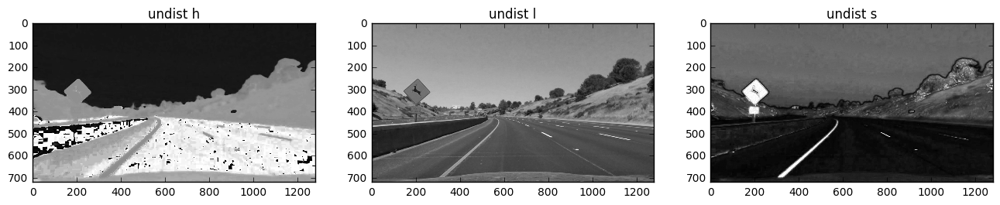

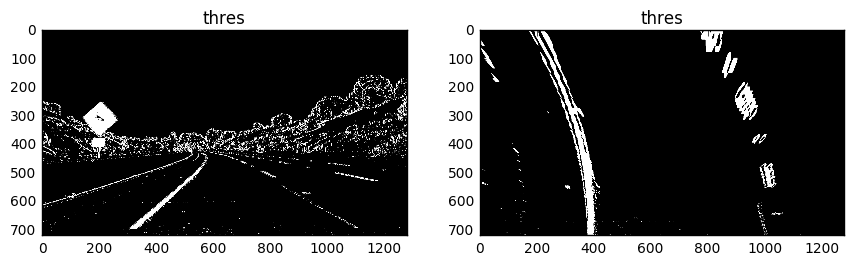

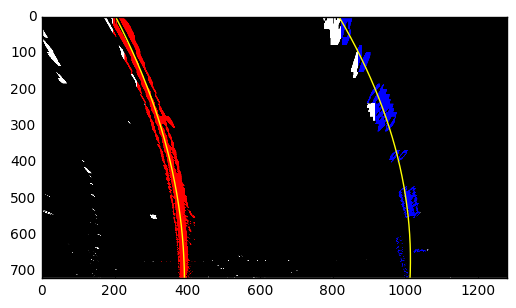

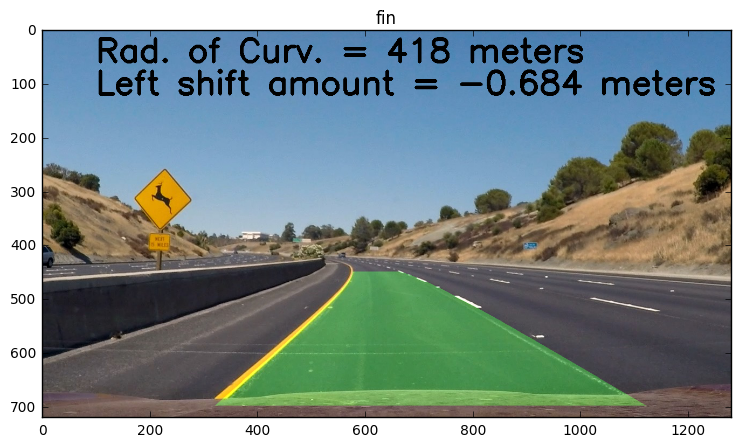

. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
test_images/test3.jpg


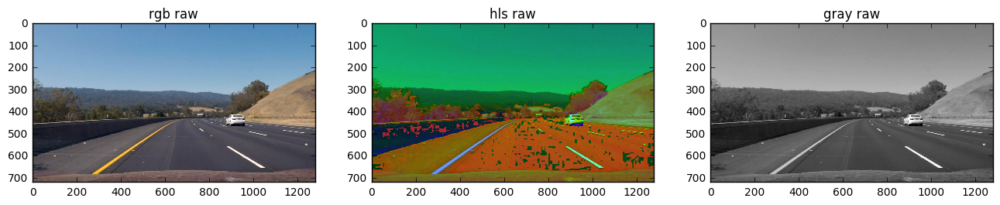

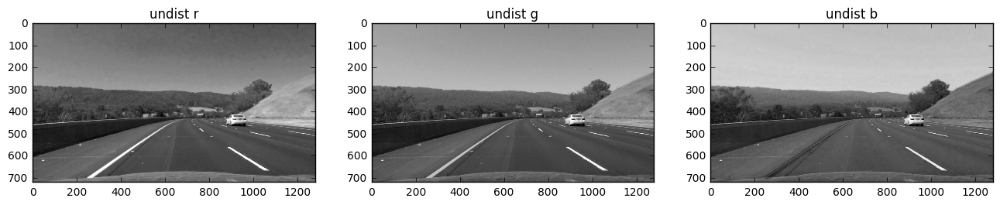

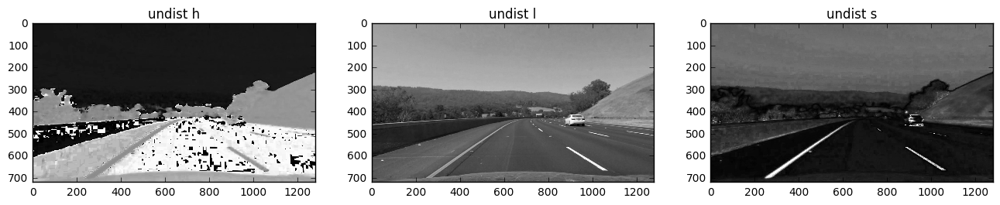

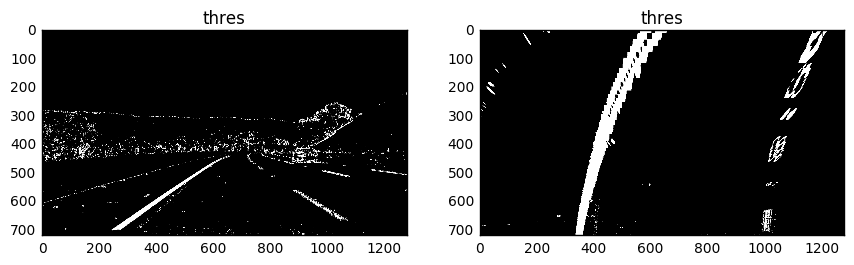

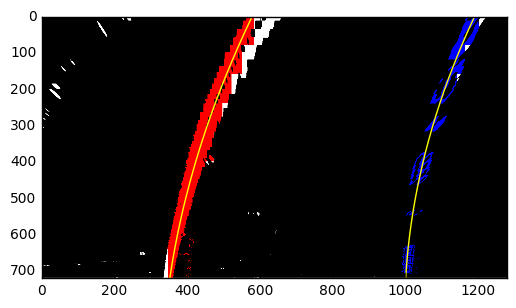

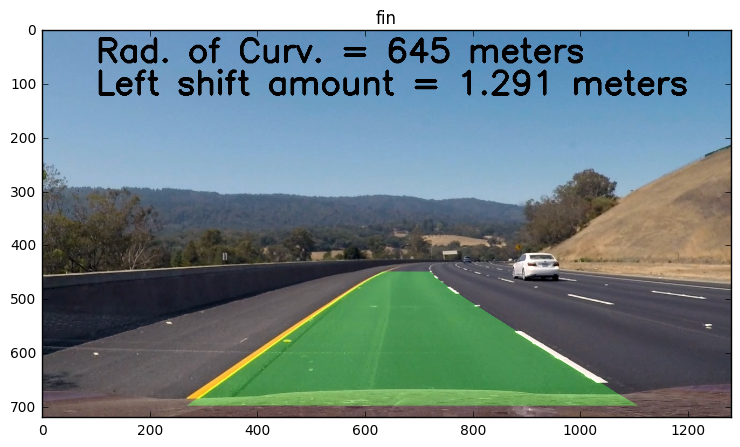

. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
test_images/test4.jpg


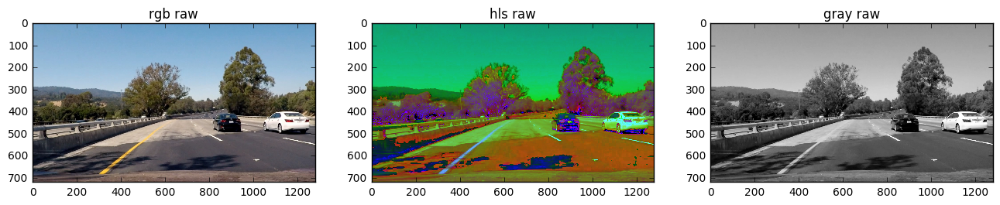

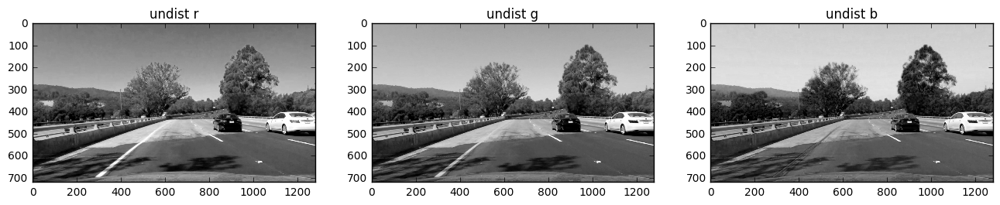

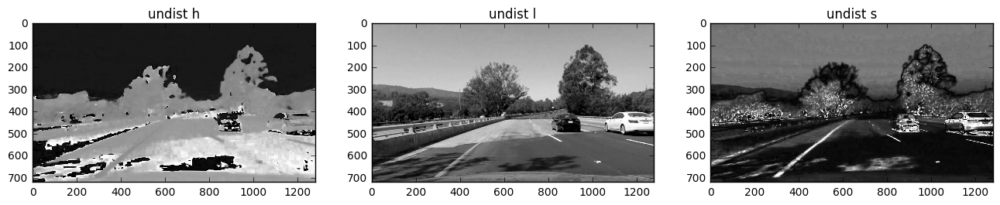

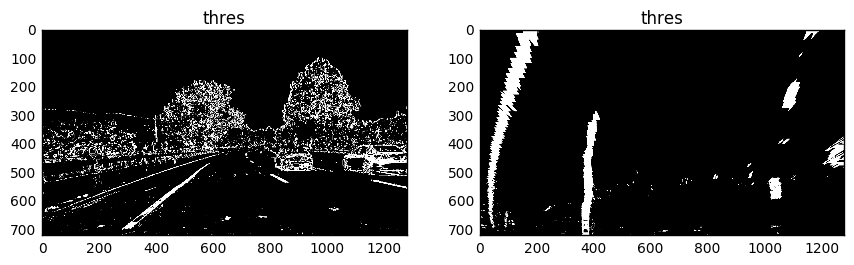

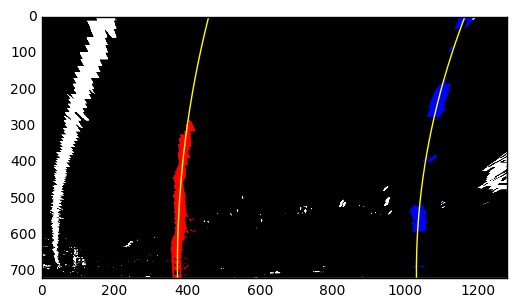

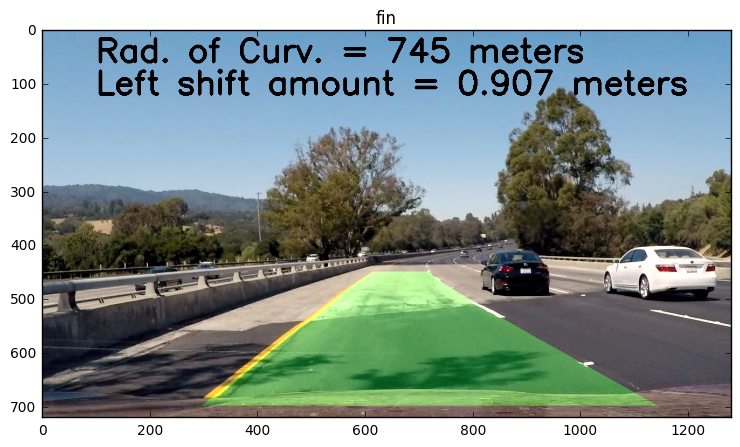

. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
test_images/test5.jpg


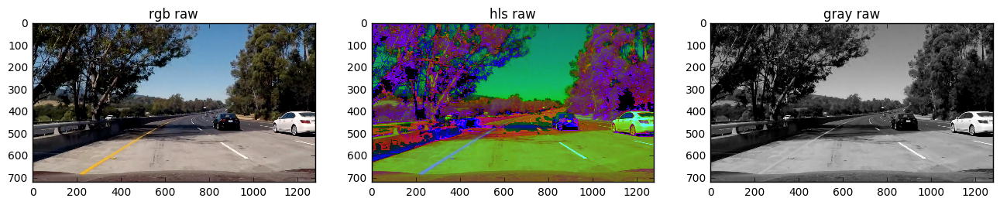

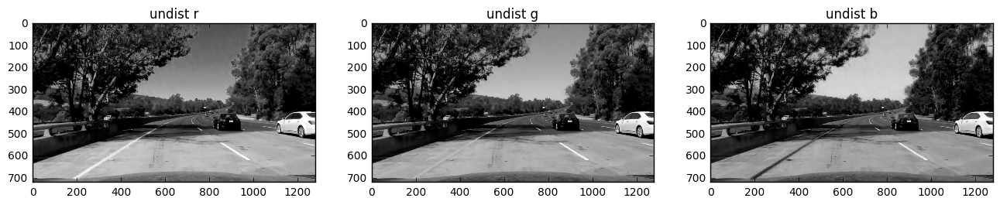

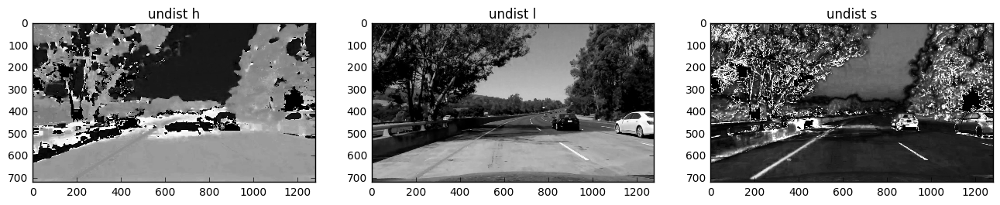

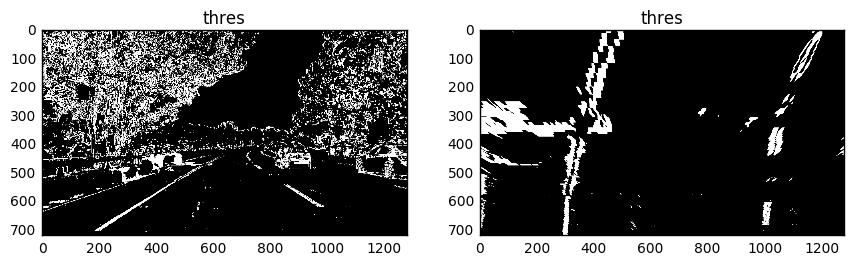

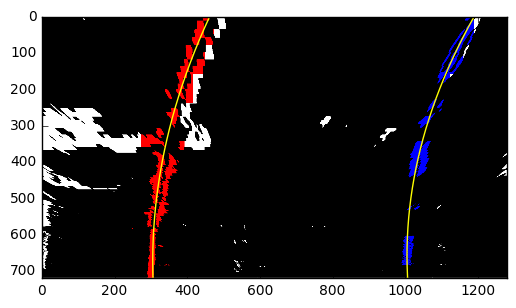

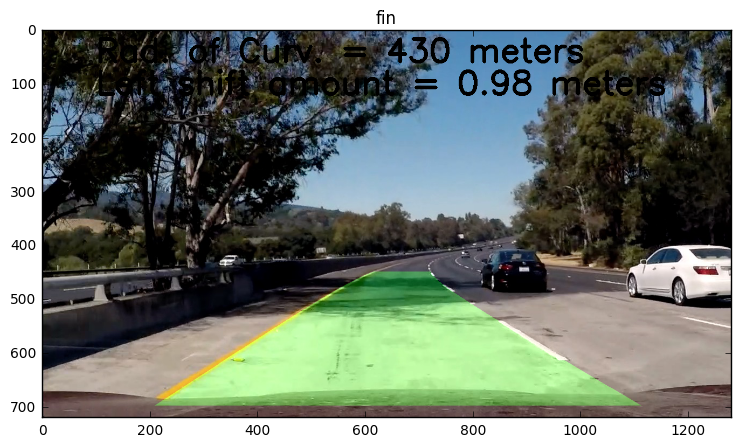

. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .
test_images/test6.jpg


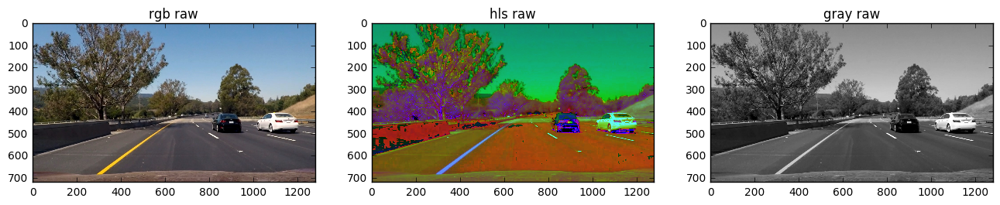

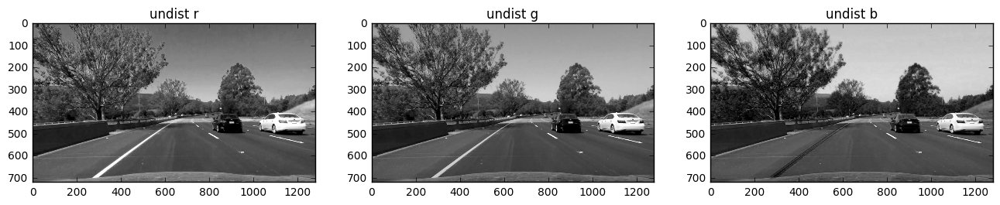

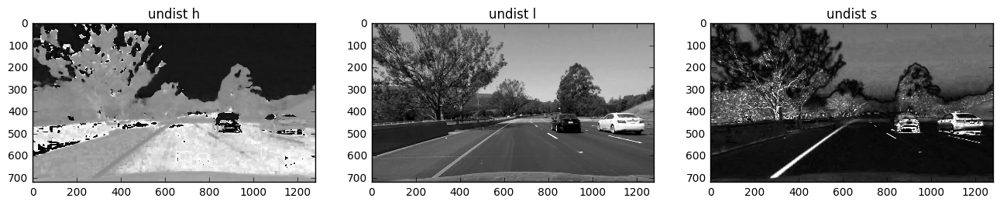

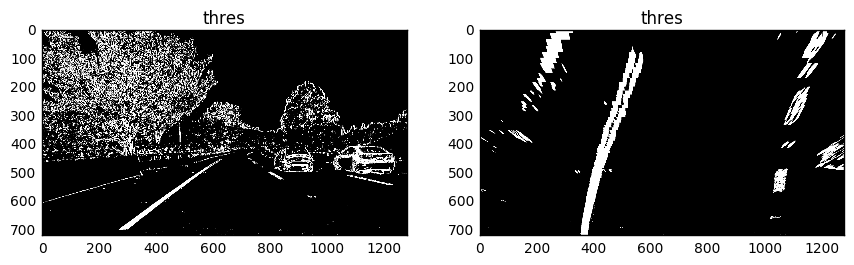

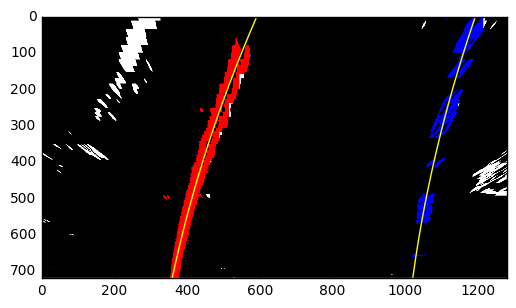

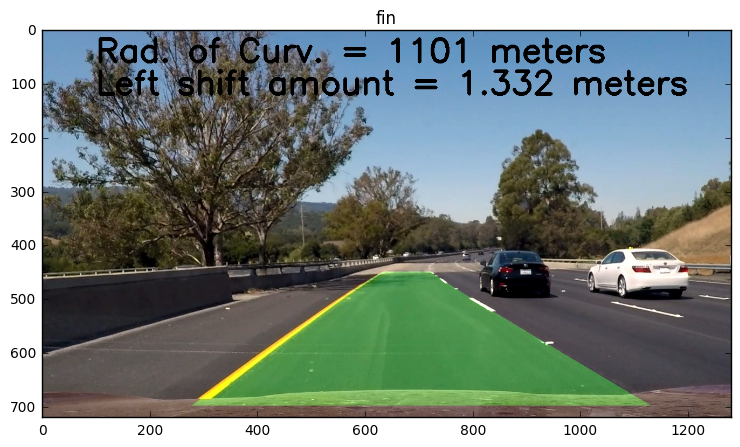

In [10]:
"""

debug plot

"""

buffer_leftx = [[0.]]
buffer_lefty = [[0.]]
buffer_rightx = [[0.]]
buffer_righty = [[0.]]

filter_counter = 0
filter_buffer_left_fit = []
filter_buffer_right_fit = []

for f in files:
    print('. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .')
    print('. * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * . * .')
    print(f)
    
    results = results_store[f]
    plot_debug(results)


## Run lane tracking algorithm on video

In [11]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


In [12]:



debug_mode_switch = [0]

white_output = 'project_video_test.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)
print('saved video')


[MoviePy] >>>> Building video project_video_test.mp4
[MoviePy] Writing video project_video_test.mp4


100%|█████████▉| 1260/1261 [02:23<00:00,  8.68it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_test.mp4 

CPU times: user 2min 47s, sys: 22.6 s, total: 3min 10s
Wall time: 2min 24s
saved video


In [ ]:
"""
    
    fin

"""